In [1]:
import os
import cv2
import matplotlib.pyplot as plt
from zipfile import ZipFile
from urllib.request import urlretrieve
from IPython.display import YouTubeVideo, display, HTML
from base64 import b64encode

%matplotlib inline


In [2]:
def download_unzip(url, file_path):
    print(f"downloading ",end=" ")
    urlretrieve(url, file_path)
    try:
        # Extrating zipfile using zipfile package
        with ZipFile(file_path) as z:
            z.extractall(os.path.split(file_path)[0])
        print("done")
    except Exception as e:
        print(f"invalid file",e)



In [6]:
Url='https://www.dropbox.com/s/p8h7ckeo2dn1jtz/opencv_bootcamp_assets_NB6.zip?dl=1'
asset_z_path=os.path.join(os.getcwd(),f"opencv_bootcamp_assets_NB6.zip")

if not os.path.exists(asset_z_path):
    download_unzip(Url,asset_z_path)

In [7]:
#Read Video from Source
source="race_car.mp4"
cap=cv2.VideoCapture(source)

In [8]:
if not cap.isOpened():
    print(f"Error opening video stream or file{source}")

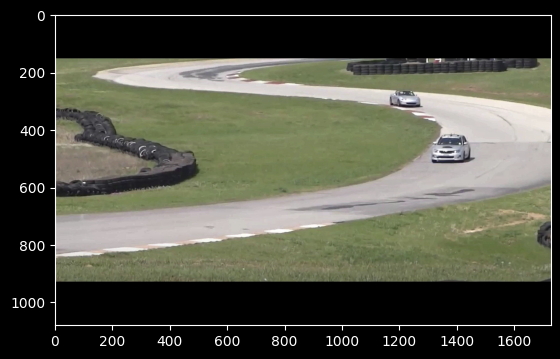

In [9]:
# Read and display one frame
ret,frame=cap.read()

plt.imshow(frame[...,::-1])

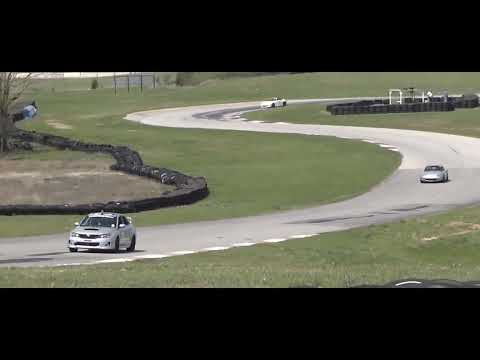

In [10]:
video = YouTubeVideo("RwxVEjv78LQ", width=700, height=438)
display(video)


In [17]:
# write video using opencv4

# Default resolutions of the frame are obtained.
# Convert the resolutions from float to integer.

print(f"{cap.get(0)},{cap.get(1)},{cap.get(2)},{cap.get(3)},{cap.get(4)}")
frame_height=int(cap.get(4))
frame_width=int(cap.get(3))

# Define the codec and create VideoWriter object.

# out_avi=cv2.VideoWriter("race_car_out.avi",cv2.VideoWriter.fourcc('M','J','P',"G"),10,(frame_width,frame_height))
out_avi=cv2.VideoWriter("race_car_out.avi", cv2.VideoWriter_fourcc("M", "J", "P", "G"), 10, (frame_width, frame_height))
out_mp4=cv2.VideoWriter("race_car_out.mp4",cv2.VideoWriter.fourcc(*"XVID"),20,(frame_width,frame_height))

0.0,1.0,0.0016666666666666668,1728.0,1080.0


In [18]:
# Read until video is completed
while cap.isOpened():
    has_frame,frame=cap.read()
    if has_frame:
        out_avi.write(frame)
        out_mp4.write(frame)
    else:
        break

# When everything done, release the VideoCapture and VideoWriter objects

cap.release()
out_avi.release()
out_mp4.release()



In [25]:
pip install ffmpeg-python



   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------


[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [29]:
mp4 = open("race_car_out.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""<video width=700 controls><source src="{data_url}" type="video/mp4"></video>""")